# Estatística Descritiva - Estudo de Caso

## Desastre ambiental em Mariana

No dia 5 de novembro de 2015, a barragem de Fundão localizada em Mariana- MG, que armazenava os rejeitos do tratamento de minério de ferro da empresa Samarco Mineração S. A. rompeu. O evento foi classificado de acordo com o Governo do Estado de Minas Gerais como o maior desastre ambiental do Brasil.

Nosso estudo de caso proposto, irá contemplar diversas atividades que visam investigar, a partir do dados de monitoramente contínuo do Instituto Mineiro de Gestão das Águas ([IGAM](https://portalinfohidro.igam.mg.gov.br/monitoramento-de-qualidade-das-aguas)) , como a concentrações de metais e parâmetros de qualidade da água do Rio Doce estão evoluindo após o rompimento da barragem.


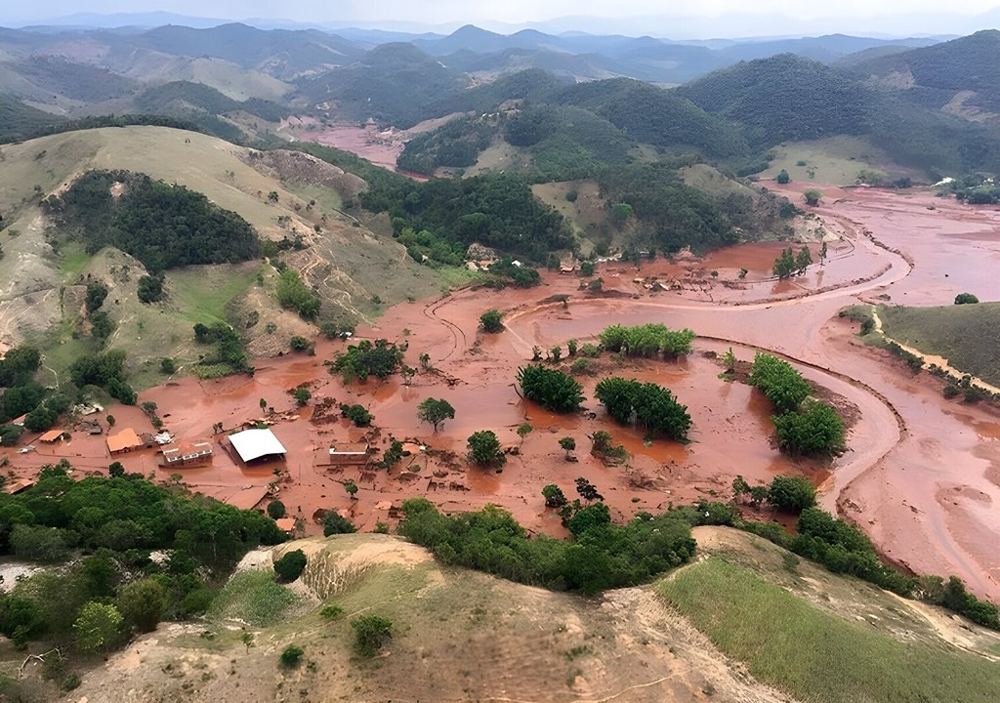

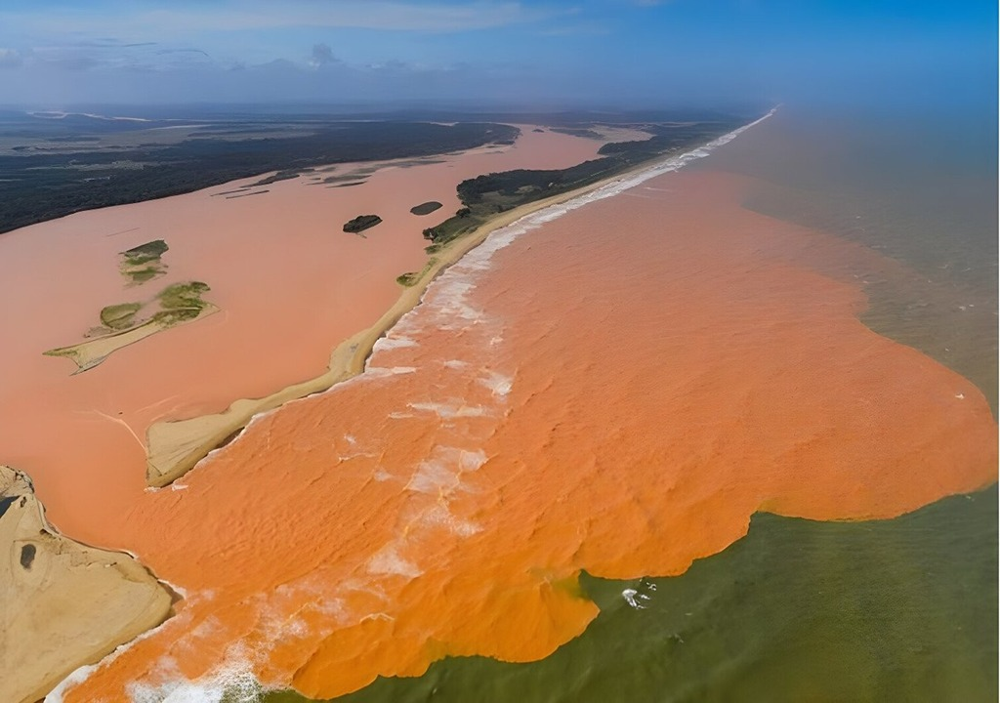

Vale ressaltar também o papel do IGAM, este que desempenha um papel crucial ao **disponibilizar dados transparentes sobre a gestão dos recursos hídricos em Minas Gerais**. Essa transparência não apenas informa e envolve a comunidade, mas também embasa políticas governamentais e decisões estratégicas, sendo essencial para enfrentar desafios relacionados à água, como escassez e poluição.

Para essa atividade, selecionou-se o **manganês como metal de interesse, em sua fração total, e a turbidez, como parâmetro de qualidade da água.**

Com o intuito de incentivar a realização dessa atividade, existem estudos que indicam que crianças expostas ao manganês através do consumo de água potável demonstraram deficiências intelectuais. Além disso, há pesquisas que relatam a ocorrência de distúrbios psiquiátricos graves em mineiros chilenos que foram intoxicados por esse metal. Quanto ao parâmetro de turbidez, sua seleção se deu devido à sua utilidade prática e indicativa na avaliação da qualidade da água, que foi significativamente prejudicada devido ao incidente de rompimento, portanto o uso desses dadados é de total importância para entender o impácto desse desastre.

Desta forma, através da análise de dados de monitoramento (como as concentrações de resíduos, metais, parâmetros de qualidades e entre outros), iremos responder algumas questões através de um estudo de caso visando mostrar como a estatística consegue trazer respostas e soluções para essa problemática, para termos ideia, abaixo há um mapa mostrando os danos e os pontos que iremos visualizar através dos dados.

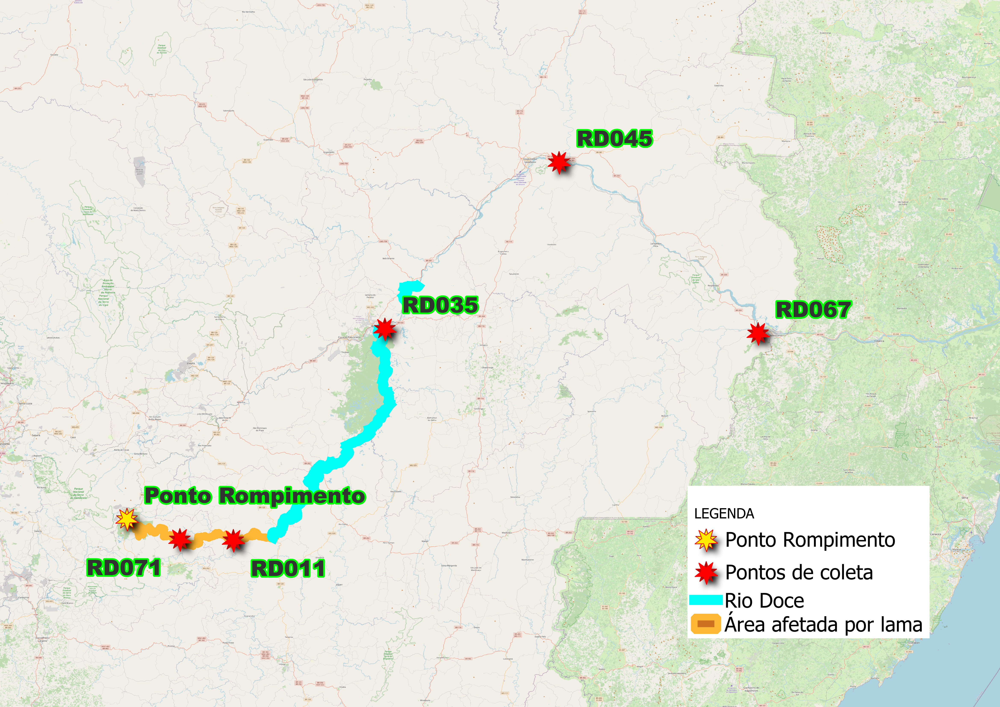

**Pergunta 1: As concentrações estão diminuindo desde o rompimento?**

Vamos explorar diferenças significativas e tendências ao longo do tempo.

**Pergunta 2: O impacto é igual em toda a bacia ou é mais acentuado próximo ao rompimento? Se é acentuado, até onde é preocupante?**

Analisaremos a distribuição espacial do impacto para uma compreensão mais profunda.

## Importação de Dados e descrições iniciais

In [ ]:
import pandas as pd

# Leitura de um arquivo CSV
# dados = pd.read_csv('dados.csv')

# Escrita de um DataFrame para um arquivo CSV
# dados.to_csv('dados_saida.csv', index=False)

# URL do arquivo Excel
url = 'https://github.com/tiagomarum/aulas_ds/raw/main/analitos_original.xlsx'

# Ler o arquivo Excel diretamente da URL
df = pd.read_excel(url, engine='openpyxl')

# Exibir as primeiras linhas do DataFrame
df.head()



,Data de Amostragem,Estação,Manganês total,Turbidez
0,2012-01-17 10:30:00,RD071,1.6546,68.2
1,2012-01-20 10:25:00,RD035,0.3450,73.8
2,2012-01-26 16:25:00,RD045,0.1099,21.4
3,2012-01-29 17:55:00,RD067,0.0845,38.3
4,2012-04-03 11:30:00,RD071,0.8240,82.9


In [ ]:
# Renomear as colunas
novos_nomes = {
    'Data de Amostragem': 'datahora',
    'Estação': 'estacao',
    'Manganês total': 'manganes',
    'Turbidez': 'turbidez'}
df = df.rename(columns=novos_nomes)

# Exibir as primeiras linhas do DataFrame com os nomes alterados
df.head()


,datahora,estacao,manganes,turbidez
0,2012-01-17 10:30:00,RD071,1.6546,68.2
1,2012-01-20 10:25:00,RD035,0.3450,73.8
2,2012-01-26 16:25:00,RD045,0.1099,21.4
3,2012-01-29 17:55:00,RD067,0.0845,38.3
4,2012-04-03 11:30:00,RD071,0.8240,82.9


In [ ]:
# Quais estações estão presentes no df
print(df['Estação'].unique())

['RD071' 'RD035' 'RD045' 'RD067' 'RD011']


In [ ]:
# Contagem de resultados de manganes e turbidez por estacao
print(df.groupby('estacao')['manganes'].count())
print(df.groupby('estacao')['turbidez'].count())


estacao
RD011    60
RD035    70
RD045    79
RD067    70
RD071    79
Name: manganes, dtype: int64
estacao
RD011     60
RD035    103
RD045    103
RD067    103
RD071     79
Name: turbidez, dtype: int64


In [ ]:
# Resumo estatístico
summary_df_mg = df.groupby(['estacao'])['manganes'].agg(['count', 'mean', 'median', 'min', 'max','std'])
print(f"\n Resumo Estatístico por Ponto (Manganês Total):")
print(summary_df_mg)

summary_df_turbidez = df.groupby(['estacao'])['turbidez'].agg(['count', 'mean', 'median', 'min', 'max','std'])
print(f"\n Resumo Estatístico por Ponto (Turbidez):")
print(summary_df_turbidez)



 Resumo Estatístico por Ponto (Manganês Total):
         count      mean    median       min       max       std
estacao                                                         
RD011       60  0.684700  0.218525  0.033027  5.797405  1.125058
RD035       70  0.236350  0.153179  0.028654  1.821000  0.249558
RD045       79  0.165732  0.036700  0.009700  5.637000  0.641540
RD067       70  0.064265  0.021517  0.003000  1.578000  0.191501
RD071       79  0.412741  0.144180  0.022000  4.842959  0.673463

 Resumo Estatístico por Ponto (Turbidez):
         count        mean  median   min     max         std
estacao                                                     
RD011       60  254.899500    52.7  3.57  4105.0  594.440360
RD035      103  242.301942    48.9  2.56  7470.0  841.693618
RD045      103  163.249903    20.6  0.50  4672.0  631.546787
RD067      103  150.230971    16.5  1.55  6500.0  678.969773
RD071       79  197.451392    29.5  1.80  5228.0  699.653522


In [ ]:
# prompt: Calcular a moda de manganes para cada estacao e, depois, fazer um gráfico para a estacao com maior moda

import pandas as pd
import matplotlib.pyplot as plt

# Função para calcular a moda contínua usando KDE
def calcular_moda_continua(series):
    series = series.dropna()  # Remove NaNs
    if len(series) == 0:
        return None
    kde = gaussian_kde(series, bw_method='scott')
    x_values = np.linspace(series.min(), series.max(), 1000)
    kde_values = kde(x_values)
    moda_continua = x_values[np.argmax(kde_values)]
    return moda_continua

# Calcular a moda contínua para cada estação
moda_por_estacao_continua = df.groupby('estacao')['manganes'].apply(calcular_moda_continua)

# Exibir a moda contínua por estação
print(moda_por_estacao_continua)

estacao
RD011    0.217671
RD035    0.134509
RD045    0.066029
RD067    0.028225
RD071    0.147470
Name: manganes, dtype: float64


In [ ]:
# prompt: juntar o summary_df_mg com o moda por estacao e expor a tabela

# Juntar o summary_df_mg com o moda por estacao
summary_df_mg['moda'] = moda_por_estacao_continua

# Expor a tabela
print(summary_df_mg)


         count      mean    median       min       max       std  manganes  \
estacao                                                                      
RD011       60  0.684700  0.218525  0.033027  5.797405  1.125058     0.495   
RD035       70  0.236350  0.153179  0.028654  1.821000  0.249558     0.280   
RD045       79  0.165732  0.036700  0.009700  5.637000  0.641540     0.193   
RD067       70  0.064265  0.021517  0.003000  1.578000  0.191501     0.003   
RD071       79  0.412741  0.144180  0.022000  4.842959  0.673463     0.485   

             moda  
estacao            
RD011    0.217671  
RD035    0.134509  
RD045    0.066029  
RD067    0.028225  
RD071    0.147470  


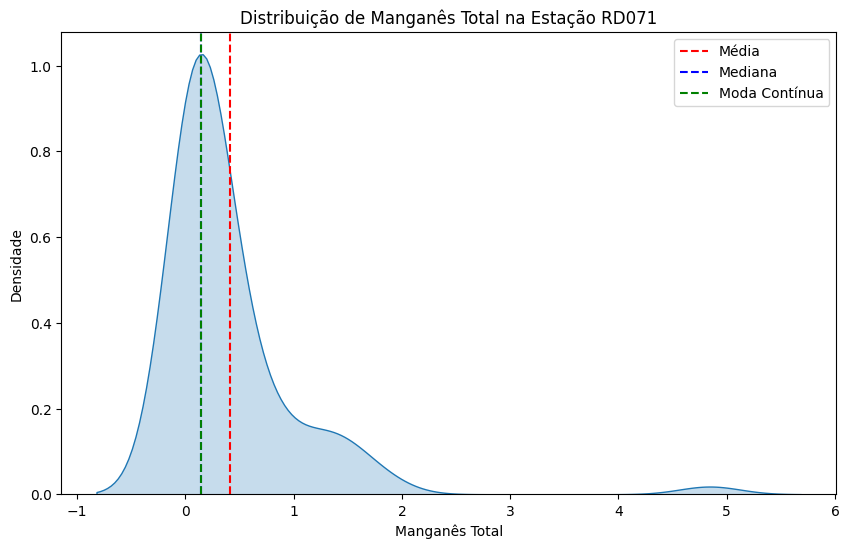

Média: 0.41274137989803067
Moda Contínua: 0.14747040262942943
Mediana: 0.1441798624


In [ ]:
import seaborn as sns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import numpy as np

# Filtrar o ponto RD071
df_RD071 = df[df['estacao'] == 'RD071']
# Remover valores NaN ou infinitos na coluna 'manganes'
df_RD071 = df_RD071[np.isfinite(df_RD071['manganes'])]

# Calcular média, moda e mediana
media_RD071 = df_RD071['manganes'].mean()
mediana_RD071 = df_RD071['manganes'].median()

# Calcular a moda contínua utilizando KDE
kde = gaussian_kde(df_RD071['manganes'], bw_method='scott')
x_values = np.linspace(df_RD071['manganes'].min(), df_RD071['manganes'].max(), 1000)
kde_values = kde(x_values)
moda_RD071_continua = x_values[np.argmax(kde_values)]

# Plotar o density plot
plt.figure(figsize=(10, 6))
sns.kdeplot(df_RD071['manganes'], fill=True)
plt.axvline(media_RD071, color='red', linestyle='--', label='Média')
plt.axvline(mediana_RD071, color='blue', linestyle='--', label='Mediana')
plt.axvline(moda_RD071_continua, color='green', linestyle='--', label='Moda Contínua')
plt.title('Distribuição de Manganês Total na Estação RD071')
plt.xlabel('Manganês Total')
plt.ylabel('Densidade')
plt.legend()
plt.show()

# Exibir os valores calculados
print(f'Média: {media_RD071}')
print(f'Moda Contínua: {moda_RD071_continua}')
print(f'Mediana: {mediana_RD071}')


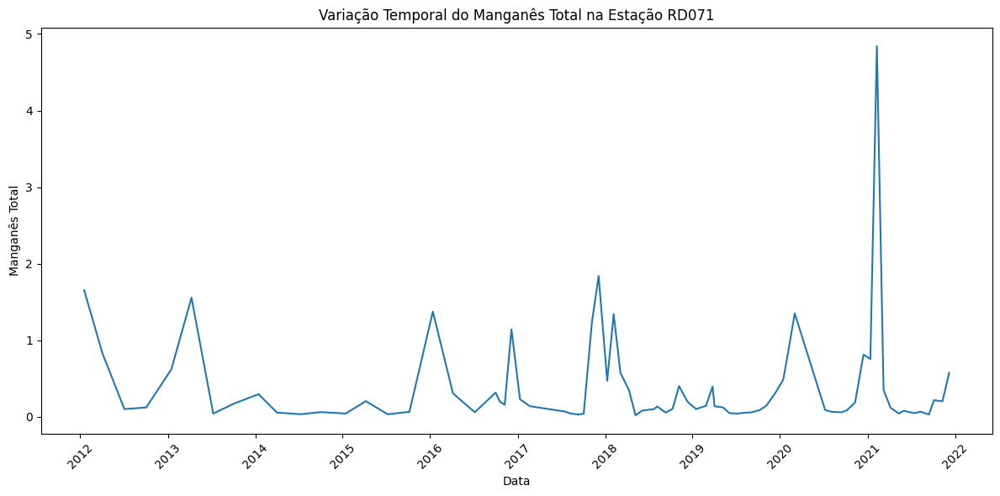

In [ ]:
# prompt: plot temporal do RD071

# Converter a coluna 'datahora' para datetime
df_RD071['datahora'] = pd.to_datetime(df_RD071['datahora'])

# Ordenar o DataFrame pela data
df_RD071 = df_RD071.sort_values('datahora')

# Plotar o gráfico temporal
plt.figure(figsize=(12, 6))
plt.plot(df_RD071['datahora'], df_RD071['manganes'])
plt.title('Variação Temporal do Manganês Total na Estação RD071')
plt.xlabel('Data')
plt.ylabel('Manganês Total')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
df_RD071

,datahora,estacao,manganes,turbidez,intervalo
0,2012-01-17 10:30:00,RD071,1.654600,68.20,NaT
4,2012-04-03 11:30:00,RD071,0.824000,82.90,64 days 17:35:00
8,2012-07-03 11:25:00,RD071,0.102700,9.10,78 days 17:05:00
12,2012-10-02 13:15:00,RD071,0.123300,9.50,78 days 18:45:00
16,2013-01-15 12:25:00,RD071,0.622000,72.90,92 days 17:40:00
...,...,...,...,...,...
426,2021-08-10 15:00:00,RD071,0.067685,7.87,0 days 00:45:00
431,2021-09-13 17:30:00,RD071,0.031517,5.38,0 days 00:45:00
435,2021-10-05 11:15:00,RD071,0.218798,40.80,19 days 17:20:00
440,2021-11-09 11:50:00,RD071,0.203817,43.10,21 days 18:00:00
